In [1]:
path = '/home/naman21266/Atul_ECG_Codes/Atul codes/codes/data/'

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, activations, regularizers, optimizers, losses, metrics, callbacks
import matplotlib.pyplot as plt
from tensorflow.keras import backend as K
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

2024-09-22 05:44:51.040604: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-22 05:44:51.053459: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-22 05:44:51.057645: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-22 05:44:51.067328: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-22 05:44:51.723209: W tensorflow/compiler/tf2

In [3]:
x_train = np.load(path + 'x_train.npy')
y_train = np.load(path + 'y_train.npy')
x_test  = np.load(path + 'x_test.npy')
y_test  = np.load(path + 'y_test.npy')

# x_train = x_train.transpose(0, 2, 1)                # transpose working correctly
# x_test  = x_test.transpose(0, 2, 1)

# x_train = x_train.reshape(19267, 12, 1000, 1)       # Added another channel
# x_test  = x_test.reshape(2163, 12, 1000, 1)

print("X_train :", x_train.shape)
print("Y_train :", y_train.shape)
print("X_test  :", x_test.shape)
print("Y_test  :", y_test.shape)
print('Data loaded')

X_train : (19267, 1000, 12)
Y_train : (19267, 5)
X_test  : (2163, 1000, 12)
Y_test  : (2163, 5)
Data loaded


In [4]:
import pandas as pd

label_cnt = {}
for i in y_train:
    key = tuple(i.tolist())
    if key not in label_cnt:
        label_cnt[key] = 1
    else:
        label_cnt[key] += 1

df = pd.DataFrame(list(label_cnt.items()), columns=['Label Combination', 'Count'])
df = df.sort_values(by='Count', ascending=False)
print(df)


   Label Combination  Count
0    (0, 0, 0, 1, 0)   8170
1    (0, 0, 1, 0, 0)   2282
2    (0, 0, 0, 0, 1)   2163
4    (1, 0, 0, 0, 0)   1525
7    (1, 0, 1, 0, 0)   1167
10   (0, 1, 0, 0, 1)    710
5    (0, 0, 1, 0, 1)    541
3    (0, 1, 0, 0, 0)    480
8    (1, 0, 0, 0, 1)    434
13   (1, 0, 0, 1, 0)    362
11   (0, 1, 1, 0, 1)    320
6    (1, 1, 0, 0, 0)    273
12   (1, 0, 1, 0, 1)    202
15   (1, 1, 0, 0, 1)    186
9    (0, 1, 1, 0, 0)    166
14   (1, 1, 1, 0, 1)    142
17   (1, 1, 1, 0, 0)    112
16   (0, 0, 0, 1, 1)     24
18   (1, 0, 0, 1, 1)      5
19   (0, 1, 0, 1, 0)      2
20   (1, 1, 1, 1, 0)      1


In [5]:
import wfdb
import numpy as np

record = wfdb.rdrecord('/home/naman21266/Codes/Noise_MIT/em')
record1 = wfdb.rdrecord('/home/naman21266/Codes/Noise_MIT/bw')
record2 = wfdb.rdrecord('/home/naman21266/Codes/Noise_MIT/ma')
noise_signal_em = record.p_signal
noise_signal_bw = record1.p_signal
noise_signal_ma = record2.p_signal

# Inspect the shape of the noise signal
print(f"Noise signal-EM shape: {noise_signal_em.shape}")
print(f"Noise signal-BW shape: {noise_signal_bw.shape}")
print(f"Noise signal-MA shape: {noise_signal_ma.shape}")


Noise signal-EM shape: (650000, 2)
Noise signal-BW shape: (650000, 2)
Noise signal-MA shape: (650000, 2)


In [6]:
import scipy.signal as signal

# Function to downsample the noise signals
def downsample_signal(noise_signal, original_rate, target_rate):
    downsample_factor = int(original_rate // target_rate)
    return signal.decimate(noise_signal, downsample_factor, axis=0)

# Assuming the original sampling rate is 360 Hz, and target is 100 Hz
original_rate = 360
target_rate = 100

# Downsample the EM, BW, and MA signals
downsampled_em = downsample_signal(noise_signal_em, original_rate, target_rate)
downsampled_bw = downsample_signal(noise_signal_bw, original_rate, target_rate)
downsampled_ma = downsample_signal(noise_signal_ma, original_rate, target_rate)

noise_signal_em = downsampled_em
noise_signal_bw = downsampled_bw
noise_signal_ma = downsampled_ma

# Print the new shape of the downsampled signals
print(downsampled_em.shape)
print(downsampled_bw.shape)
print(downsampled_ma.shape)


(216667, 2)
(216667, 2)
(216667, 2)


In [7]:
x_train[0].shape

(1000, 12)

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import wfdb
import numpy as np

# Define GELU Activation
class GELU(nn.Module):
    def forward(self, x):
        return F.gelu(x)

# Define Swish Activation
class Swish(nn.Module):
    def forward(self, x):
        return x * torch.sigmoid(x)

# Residual Block
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv1d(in_channels, out_channels, kernel_size=3, padding=1)
        self.conv2 = nn.Conv1d(out_channels, out_channels, kernel_size=3, padding=1)
        self.norm1 = nn.BatchNorm1d(out_channels)
        self.norm2 = nn.BatchNorm1d(out_channels)
        self.activation = GELU()
        
        if in_channels != out_channels:
            self.shortcut = nn.Conv1d(in_channels, out_channels, kernel_size=1)
        else:
            self.shortcut = nn.Identity()

    def forward(self, x):
        identity = self.shortcut(x)
        out = self.activation(self.norm1(self.conv1(x)))
        out = self.norm2(self.conv2(out))
        out += identity
        out = self.activation(out)
        return out

# Attention Block
class AttentionBlock(nn.Module):
    def __init__(self, channels):
        super(AttentionBlock, self).__init__()
        self.norm = nn.BatchNorm1d(channels)
        self.qkv = nn.Conv1d(channels, channels * 3, kernel_size=1)
        self.proj_out = nn.Conv1d(channels, channels, kernel_size=1)

    def forward(self, x):
        norm_x = self.norm(x)
        qkv = self.qkv(norm_x)
        q, k, v = torch.chunk(qkv, 3, dim=1)
        attention = torch.softmax(torch.bmm(q.transpose(1, 2), k) / q.shape[1]**0.5, dim=-1)
        out = torch.bmm(v, attention.transpose(1, 2))
        out = self.proj_out(out)
        return out + x

# Diffusion Model
class DiffusionModel(nn.Module):
    def __init__(self, in_channels=12, time_dim=1000, base_channels=64):
        super(DiffusionModel, self).__init__()
        self.init_conv = nn.Conv1d(in_channels, base_channels, kernel_size=3, padding=1)
        self.resblock1 = ResidualBlock(base_channels, base_channels * 2)
        self.attn1 = AttentionBlock(base_channels * 2)
        self.resblock2 = ResidualBlock(base_channels * 2, base_channels * 4)
        self.attn2 = AttentionBlock(base_channels * 4)
        self.final_conv = nn.Conv1d(base_channels * 4, in_channels, kernel_size=3, padding=1)

    def forward(self, x, noise_level):
        # Apply initial convolution
        x = self.init_conv(x)
        
        # First Residual and Attention Blocks with noise injection
        x = self.resblock1(x)
        noise = noise_level * torch.randn_like(x)
        x = self.attn1(x + noise)
        
        # Second Residual and Attention Blocks with noise injection
        x = self.resblock2(x)
        noise = noise_level * torch.randn_like(x)
        x = self.attn2(x + noise)
        
        # Final convolution
        x = self.final_conv(x)
        return x

# Function to calculate noise level to achieve target SNR
def calculate_noise_level(signal, target_snr=19):
    signal_power = torch.mean(signal ** 2)
    noise_power = signal_power / (10 ** (target_snr / 10))
    noise_std = torch.sqrt(noise_power)
    return noise_std

# Example usage
if __name__ == "__main__":
    
    # Example input: single ECG sample of shape (12, 1000)
    single_ecg_sample = torch.from_numpy(x_train[5].T).float().unsqueeze(0)
    
    # Calculate the noise level to ensure SNR is above 15
    noise_level = calculate_noise_level(single_ecg_sample, target_snr=21)
    
    # Initialize the diffusion model
    diffusion_model = DiffusionModel()
    
    # Generate synthetic ECG data
    generated_ecg = diffusion_model(single_ecg_sample, noise_level)
    
    print(f"Generated ECG shape: {generated_ecg.shape}")


Generated ECG shape: torch.Size([1, 12, 1000])


In [9]:
print(generated_ecg.shape)
print(x_train[0].shape)

torch.Size([1, 12, 1000])
(1000, 12)


In [10]:
import torch

def calculate_snr(signal, noise):
    """
    Calculate the Signal-to-Noise Ratio (SNR) in decibels (dB).
    
    Parameters:
    signal (torch.Tensor): The original signal.
    noise (torch.Tensor): The noise added to the signal.
    
    Returns:
    float: The SNR in decibels (dB).
    """
    signal_power = torch.mean(signal ** 2)
    noise_power = torch.mean(noise ** 2)
    
    snr = 10 * torch.log10(signal_power / noise_power)
    return snr.item()

(1000, 12)
(1000, 12)


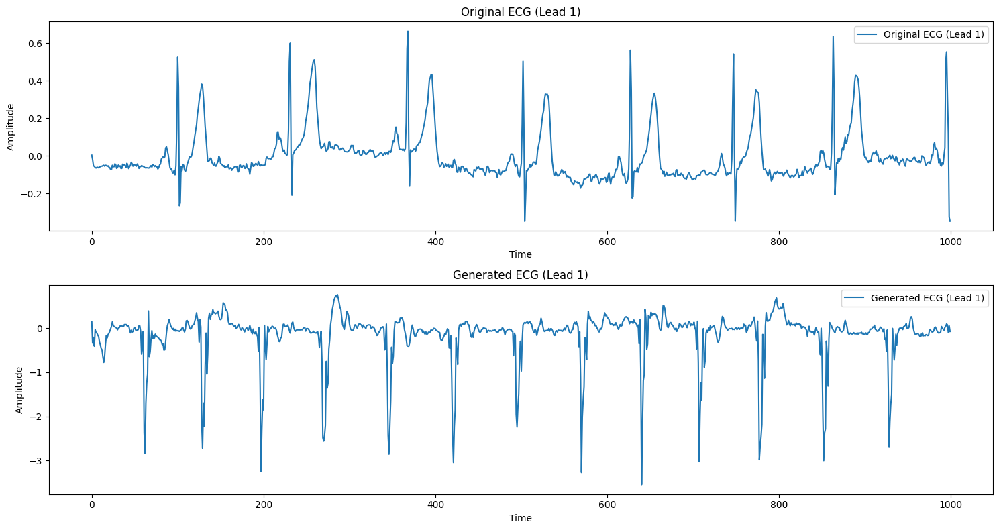

In [11]:
import matplotlib.pyplot as plt

# Convert generated ECG to shape (1000, 12)
generated_ecg_np = generated_ecg.squeeze(0).T.detach().numpy()

# Convert original ECG to shape (1000, 12)
original_ecg_np = x_train[5]

print(generated_ecg_np.shape)
print(original_ecg_np.shape)

# Plot the original and generated ECG signals for comparison
plt.figure(figsize=(15, 8))

# Plotting the first lead (Lead 1) as an example
plt.subplot(2, 1, 1)
plt.plot(original_ecg_np[:, 0], label='Original ECG (Lead 1)')
plt.title('Original ECG (Lead 1)')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(generated_ecg_np[:, 0], label='Generated ECG (Lead 1)')
plt.title('Generated ECG (Lead 1)')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()

plt.tight_layout()
plt.show()

In [11]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import math
from PIL import Image

import tensorflow as tf
from tensorflow import keras, einsum
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Layer
import tensorflow.keras.layers as nn
from functools import partial
from inspect import isfunction

# Suppressing tf.hub warnings
tf.get_logger().setLevel("ERROR")

# configure the GPU
gpu_options = tf.compat.v1.GPUOptions(per_process_gpu_memory_fraction=0.8)
config = tf.compat.v1.ConfigProto(gpu_options=gpu_options)
session = tf.compat.v1.Session(config=config)

I0000 00:00:1725682487.641674  986477 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1725682487.642695  986477 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1725682487.642833  986477 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1725682487.712046  986477 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

In [12]:
target_size = (1000, 12)
channels = 1
BATCH_SIZE=64

In [6]:
timesteps = 200

# create a fixed beta schedule
beta = np.linspace(0.0001, 0.02, timesteps)

# this will be used as discussed in the reparameterization trick
alpha = 1 - beta
alpha_bar = np.cumprod(alpha, 0)
alpha_bar = np.concatenate((np.array([1.]), alpha_bar[:-1]), axis=0)
sqrt_alpha_bar = np.sqrt(alpha_bar)
one_minus_sqrt_alpha_bar = np.sqrt(1-alpha_bar)

# this function will help us set the RNG key for Numpy
def set_key(key):
    np.random.seed(key)

# this function will add noise to the input as per the given timestamp
def forward_noise(key, x_0, t):
    set_key(key)
    noise = np.random.normal(size=x_0.shape)
    reshaped_sqrt_alpha_bar_t = np.reshape(np.take(sqrt_alpha_bar, t), (-1, 1, 1, 1))
    reshaped_one_minus_sqrt_alpha_bar_t = np.reshape(np.take(one_minus_sqrt_alpha_bar, t), (-1, 1, 1, 1))
    noisy_image = reshaped_sqrt_alpha_bar_t  * x_0 + reshaped_one_minus_sqrt_alpha_bar_t  * noise
    return noisy_image, noise

# this function will be used to create sample timestamps between 0 & T
def generate_timestamp(key, num):
    set_key(key)
    return tf.random.uniform(shape=[num], minval=0, maxval=timesteps, dtype=tf.int32)

(1000, 12)
(1, 1, 1000, 12)
(1000, 12)


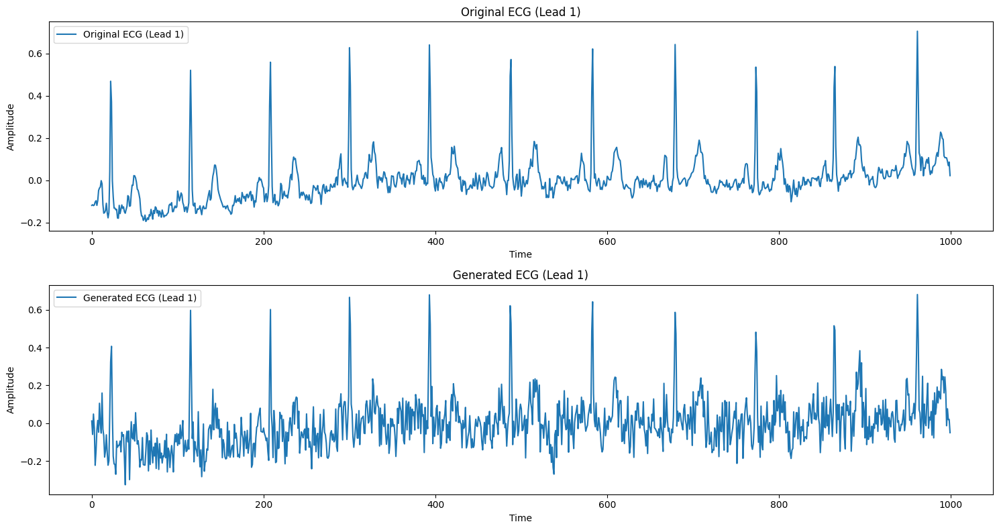

(1, 1, 1000, 12)
(1000, 12)


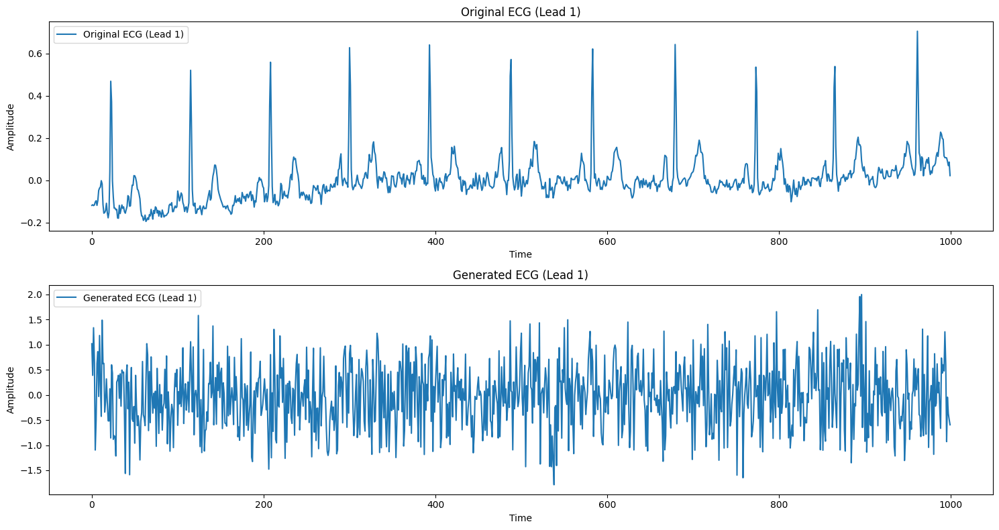

(1, 1, 1000, 12)
(1000, 12)


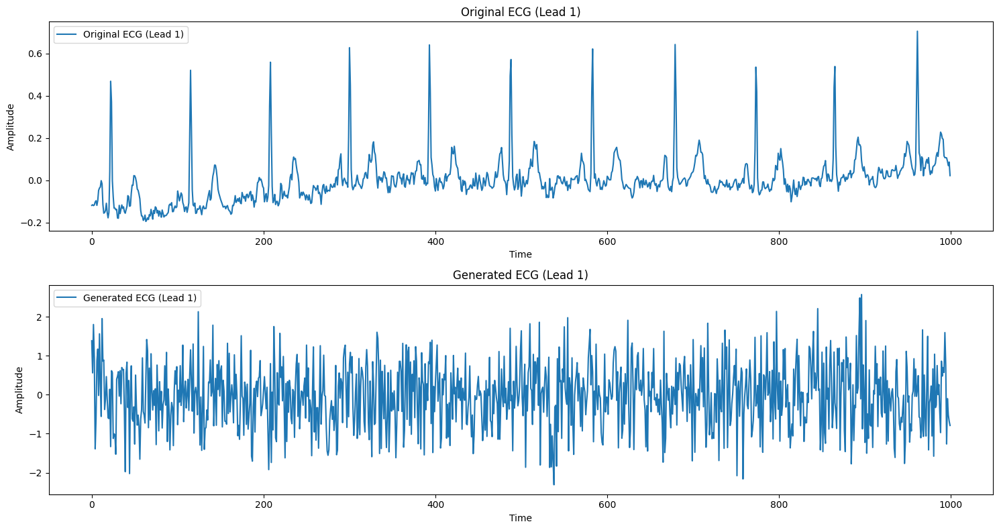

(1, 1, 1000, 12)
(1000, 12)


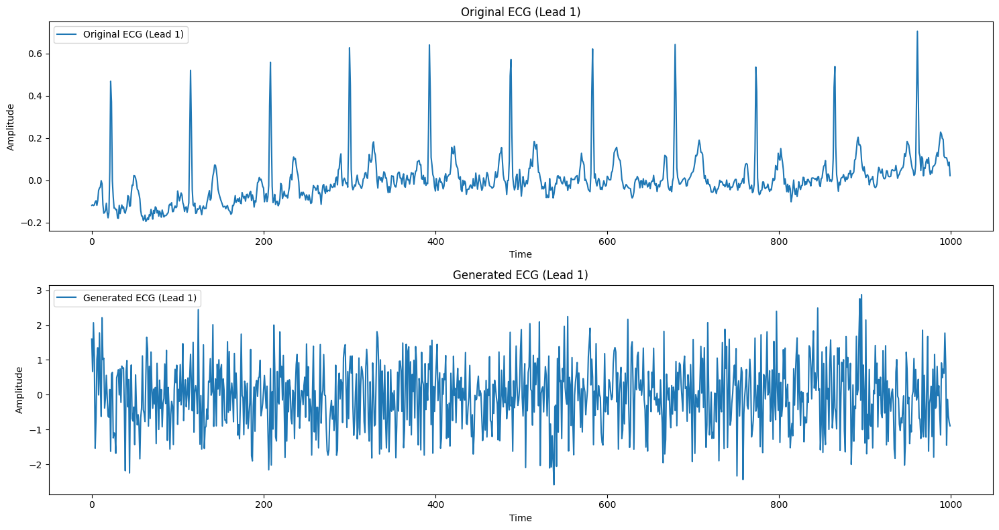

In [14]:

# Let us visualize the output image at a few timestamps
sample_mnist = x_train[0]
print(sample_mnist.shape)

for index, i in enumerate([10, 100, 150, 199]):
    noisy_im, noise = forward_noise(0, np.expand_dims(sample_mnist, 0), np.array([i,]))
    print(noisy_im.shape)  # Should print (1, 1, 1000, 12)
    
    # Squeeze the first two dimensions
    noisy_im = np.squeeze(noisy_im, axis=(0, 1))
    print(noisy_im.shape)  # Should print (1000, 12)
    plt.figure(figsize=(15, 8))

    # Plotting the first lead (Lead 1) as an example
    plt.subplot(2, 1, 1)
    plt.plot(sample_mnist[:, 0], label='Original ECG (Lead 1)')
    plt.title('Original ECG (Lead 1)')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()

    plt.subplot(2, 1, 2)
    plt.plot(noisy_im[:, 0], label='Generated ECG (Lead 1)')
    plt.title('Generated ECG (Lead 1)')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()

    plt.tight_layout()
    plt.show()
    


In [15]:
# helpers functions
def exists(x):
    return x is not None

def default(val, d):
    if exists(val):
        return val
    return d() if isfunction(d) else d

# We will use this to convert timestamps to time encodings
class SinusoidalPosEmb(Layer):
    def __init__(self, dim, max_positions=10000):
        super(SinusoidalPosEmb, self).__init__()
        self.dim = dim
        self.max_positions = max_positions

    def call(self, x, training=True):
        x = tf.cast(x, tf.float32)
        half_dim = self.dim // 2
        emb = math.log(self.max_positions) / (half_dim - 1)
        emb = tf.exp(tf.range(half_dim, dtype=tf.float32) * -emb)
        emb = x[:, None] * emb[None, :]

        emb = tf.concat([tf.sin(emb), tf.cos(emb)], axis=-1)

        return emb
        
# small helper modules
class Identity(Layer):
    def __init__(self):
        super(Identity, self).__init__()

    def call(self, x, training=True):
        return tf.identity(x)


class Residual(Layer):
    def __init__(self, fn):
        super(Residual, self).__init__()
        self.fn = fn

    def call(self, x, training=True):
        return self.fn(x, training=training) + x

def Upsample(dim):
    return nn.Conv2DTranspose(filters=dim, kernel_size=4, strides=2, padding='SAME')

def Downsample(dim):
    return nn.Conv2D(filters=dim, kernel_size=4, strides=2, padding='SAME')

class LayerNorm(Layer):
    def __init__(self, dim, eps=1e-5, **kwargs):
        super(LayerNorm, self).__init__(**kwargs)
        self.eps = eps

        self.g = tf.Variable(tf.ones([1, 1, 1, dim]))
        self.b = tf.Variable(tf.zeros([1, 1, 1, dim]))

    def call(self, x, training=True):
        var = tf.math.reduce_variance(x, axis=-1, keepdims=True)
        mean = tf.reduce_mean(x, axis=-1, keepdims=True)

        x = (x - mean) / tf.sqrt((var + self.eps)) * self.g + self.b
        return x

class PreNorm(Layer):
    def __init__(self, dim, fn):
        super(PreNorm, self).__init__()
        self.fn = fn
        self.norm = LayerNorm(dim)

    def call(self, x, training=True):
        x = self.norm(x)
        return self.fn(x)

class SiLU(Layer):
    def __init__(self):
        super(SiLU, self).__init__()

    def call(self, x, training=True):
        return x * tf.nn.sigmoid(x)

def gelu(x, approximate=False):
    if approximate:
        coeff = tf.cast(0.044715, x.dtype)
        return 0.5 * x * (1.0 + tf.tanh(0.7978845608028654 * (x + coeff * tf.pow(x, 3))))
    else:
        return 0.5 * x * (1.0 + tf.math.erf(x / tf.cast(1.4142135623730951, x.dtype)))

class GELU(Layer):
    def __init__(self, approximate=False):
        super(GELU, self).__init__()
        self.approximate = approximate

    def call(self, x, training=True):
        return gelu(x, self.approximate)

In [16]:
!pip install einops

DEPRECATION: Loading egg at /home/naman21266/miniconda3/lib/python3.12/site-packages/tensorflow_addons-0.23.0.dev0-py3.12-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: omegaconf 2.0.6 has a non-standard dependency specifier PyYAML>=5.1.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of omegaconf or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [17]:
import tensorflow_addons as tfa
print(tfa.__version__)

0.23.0-dev


/home/naman21266/miniconda3/lib/python3.12/site-packages/tensorflow_addons-0.23.0.dev0-py3.12-linux-x86_64.egg/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/home/naman21266/miniconda3/lib/python3.12/site-packages/tensorflow_addons-0.23.0.dev0-py3.12-linux-x86_64.egg/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.17.0 and is not supp

In [18]:
from einops import rearrange
from einops.layers.tensorflow import Rearrange
from functools import partial
from inspect import isfunction
import tensorflow_addons as tfa

In [19]:
# building block modules
class Block(Layer):
    def __init__(self, dim, groups=8):
        super(Block, self).__init__()
        self.proj = nn.Conv2D(dim, kernel_size=3, strides=1, padding='SAME')
        self.norm = tfa.layers.GroupNormalization(groups, epsilon=1e-05)
        self.act = SiLU()


    def call(self, x, gamma_beta=None, training=True):
        x = self.proj(x)
        x = self.norm(x, training=training)

        if exists(gamma_beta):
            gamma, beta = gamma_beta
            x = x * (gamma + 1) + beta

        x = self.act(x)
        return x

class ResnetBlock(Layer):
    def __init__(self, dim, dim_out, time_emb_dim=None, groups=8):
        super(ResnetBlock, self).__init__()

        self.mlp = Sequential([
            SiLU(),
            nn.Dense(units=dim_out * 2)
        ]) if exists(time_emb_dim) else None

        self.block1 = Block(dim_out, groups=groups)
        self.block2 = Block(dim_out, groups=groups)
        self.res_conv = nn.Conv2D(filters=dim_out, kernel_size=1, strides=1) if dim != dim_out else Identity()

    def call(self, x, time_emb=None, training=True):
        gamma_beta = None
        if exists(self.mlp) and exists(time_emb):
            time_emb = self.mlp(time_emb)
            time_emb = rearrange(time_emb, 'b c -> b 1 1 c')
            gamma_beta = tf.split(time_emb, num_or_size_splits=2, axis=-1)

        h = self.block1(x, gamma_beta=gamma_beta, training=training)
        h = self.block2(h, training=training)

        return h + self.res_conv(x)

class LinearAttention(Layer):
    def __init__(self, dim, heads=4, dim_head=32):
        super(LinearAttention, self).__init__()
        self.scale = dim_head ** -0.5
        self.heads = heads
        self.hidden_dim = dim_head * heads

        self.attend = nn.Softmax()
        self.to_qkv = nn.Conv2D(filters=self.hidden_dim * 3, kernel_size=1, strides=1, use_bias=False)

        self.to_out = Sequential([
            nn.Conv2D(filters=dim, kernel_size=1, strides=1),
            LayerNorm(dim)
        ])

    def call(self, x, training=True):
        b, h, w, c = x.shape
        qkv = self.to_qkv(x)
        qkv = tf.split(qkv, num_or_size_splits=3, axis=-1)
        q, k, v = map(lambda t: rearrange(t, 'b x y (h c) -> b h c (x y)', h=self.heads), qkv)

        q = tf.nn.softmax(q, axis=-2)
        k = tf.nn.softmax(k, axis=-1)

        q = q * self.scale
        context = einsum('b h d n, b h e n -> b h d e', k, v)

        out = einsum('b h d e, b h d n -> b h e n', context, q)
        out = rearrange(out, 'b h c (x y) -> b x y (h c)', h=self.heads, x=h, y=w)
        out = self.to_out(out, training=training)

        return out

class Attention(Layer):
    def __init__(self, dim, heads=4, dim_head=32):
        super(Attention, self).__init__()
        self.scale = dim_head ** -0.5
        self.heads = heads
        self.hidden_dim = dim_head * heads

        self.to_qkv = nn.Conv2D(filters=self.hidden_dim * 3, kernel_size=1, strides=1, use_bias=False)
        self.to_out = nn.Conv2D(filters=dim, kernel_size=1, strides=1)

    def call(self, x, training=True):
        b, h, w, c = x.shape
        qkv = self.to_qkv(x)
        qkv = tf.split(qkv, num_or_size_splits=3, axis=-1)
        q, k, v = map(lambda t: rearrange(t, 'b x y (h c) -> b h c (x y)', h=self.heads), qkv)
        q = q * self.scale

        sim = einsum('b h d i, b h d j -> b h i j', q, k)
        sim_max = tf.stop_gradient(tf.expand_dims(tf.argmax(sim, axis=-1), axis=-1))
        sim_max = tf.cast(sim_max, tf.float32)
        sim = sim - sim_max
        attn = tf.nn.softmax(sim, axis=-1)

        out = einsum('b h i j, b h d j -> b h i d', attn, v)
        out = rearrange(out, 'b h (x y) d -> b x y (h d)', x = h, y = w)
        out = self.to_out(out, training=training)

        return out

In [20]:
class Unet(Model):
    def __init__(self,
                 dim=64,
                 init_dim=None,
                 out_dim=None,
                 dim_mults=(1, 2, 4, 8),
                 channels=3,
                 resnet_block_groups=8,
                 learned_variance=False,
                 sinusoidal_cond_mlp=True
                 ):
        super(Unet, self).__init__()
        
        # determine dimensions
        self.channels = channels
        
        init_dim = default(init_dim, dim // 3 * 2)
        self.init_conv = nn.Conv2D(filters=init_dim, kernel_size=7, strides=1, padding='SAME')
        
        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        in_out = list(zip(dims[:-1], dims[1:]))
        
        block_klass = partial(ResnetBlock, groups = resnet_block_groups)
        
        # time embeddings
        time_dim = dim * 4
        self.sinusoidal_cond_mlp = sinusoidal_cond_mlp
        
        self.time_mlp = Sequential([
            SinusoidalPosEmb(dim),
            nn.Dense(units=time_dim),
            GELU(),
            nn.Dense(units=time_dim)
        ], name="time embeddings")
        
        # layers
        self.downs = []
        self.ups = []
        num_resolutions = len(in_out)
        
        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append([
                block_klass(dim_in, dim_out, time_emb_dim=time_dim),
                block_klass(dim_out, dim_out, time_emb_dim=time_dim),
                Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                Downsample(dim_out) if not is_last else Identity()
            ])
  
        mid_dim = dims[-1]
        self.mid_block1 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)
        
        for ind, (dim_in, dim_out) in enumerate(reversed(in_out[1:])):
            is_last = ind >= (num_resolutions - 1)

            self.ups.append([
                block_klass(dim_out * 2, dim_in, time_emb_dim=time_dim),
                block_klass(dim_in, dim_in, time_emb_dim=time_dim),
                Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                Upsample(dim_in) if not is_last else Identity()
            ])
        
        default_out_dim = channels * (1 if not learned_variance else 2)
        self.out_dim = default(out_dim, default_out_dim)
        
        self.final_conv = Sequential([
            block_klass(dim * 2, dim),
            nn.Conv2D(filters=self.out_dim, kernel_size=1, strides=1)
        ], name="output")
        
    def call(self, x, time=None, training=True, **kwargs):
        x = self.init_conv(x)
        t = self.time_mlp(time)
        
        h = []

        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            h.append(x)
            x = downsample(x)

        x = self.mid_block1(x, t)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t)

        for block1, block2, attn, upsample in self.ups:
            x = tf.concat([x, h.pop()], axis=-1)
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            x = upsample(x)

        x = tf.concat([x, h.pop()], axis=-1)
        x = self.final_conv(x)
        return x

In [21]:
# create our unet model
unet = Unet(channels=1)
test_images = np.ones([1, 32, 32, 1])
test_timestamps = generate_timestamp(0, 1)
k = unet(test_images, test_timestamps)

# create our optimizer, we will use adam with a Learning rate of 1e-4
opt = keras.optimizers.Adam(learning_rate=1e-4)

I0000 00:00:1725682558.779000  986477 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1725682558.779201  986477 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1725682558.779326  986477 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1725682558.779590  986477 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

In [9]:
torch.cuda.empty_cache()

In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np

# Define the noise schedule function
def get_noise_schedule(num_timesteps):
    """Get noise schedule for the diffusion process."""
    alpha = np.linspace(0.1, 0.9, num_timesteps)  # Example schedule
    alpha_cumprod = np.cumprod(alpha)  # Cumulative product of alpha
    return torch.tensor(alpha, dtype=torch.float32), torch.tensor(alpha_cumprod, dtype=torch.float32)

# Define Gaussian noise function
def add_gaussian_noise(signal, noise_std):
    """Add Gaussian noise to the signal."""
    noise = torch.randn_like(signal) * noise_std
    return signal + noise

# Define function to add noise according to the diffusion model
def add_noise_to_signal(signal, noise, alpha_t, beta_t):
    """Add noise to the signal during forward process based on diffusion parameters."""
    return alpha_t * signal + beta_t * noise

# Define the Residual Block
class ResidualBlock(nn.Module):
    """A residual block with GELU activation."""
    def __init__(self, in_channels, out_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv1d(in_channels, out_channels, kernel_size=3, padding=1)
        self.gelu = nn.GELU()
        self.conv2 = nn.Conv1d(out_channels, out_channels, kernel_size=3, padding=1)
        self.residual = nn.Conv1d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()

    def forward(self, x):
        residual = self.residual(x)
        x = self.conv1(x)
        x = self.gelu(x)
        x = self.conv2(x)
        return x + residual

# Define the Self-Attention Block
class SelfAttention1D(nn.Module):
    """1D Self-Attention Layer."""
    def __init__(self, channels, num_heads=4):
        super(SelfAttention1D, self).__init__()
        self.attention = nn.MultiheadAttention(channels, num_heads, batch_first=True)

    def forward(self, x):
        x = x.permute(0, 2, 1)  # (batch_size, channels, seq_length) -> (batch_size, seq_length, channels)
        attn_output, _ = self.attention(x, x, x)
        return attn_output.permute(0, 2, 1)  # (batch_size, seq_length, channels) -> (batch_size, channels, seq_length)

# Define the U-Net 1D model
class UNet1D(nn.Module):
    """1D U-Net model with attention blocks."""
    def __init__(self, in_channels, out_channels, base_channels=64):
        super(UNet1D, self).__init__()
        self.encoder1 = ResidualBlock(in_channels, base_channels)
        self.encoder2 = ResidualBlock(base_channels, base_channels * 2)
        self.encoder3 = ResidualBlock(base_channels * 2, base_channels * 4)
        self.attn1 = SelfAttention1D(base_channels * 4)
        
        self.middle = ResidualBlock(base_channels * 4, base_channels * 4)
        self.attn2 = SelfAttention1D(base_channels * 4)
        
        self.decoder1 = ResidualBlock(base_channels * 4, base_channels * 2)
        self.attn3 = SelfAttention1D(base_channels * 2)
        self.decoder2 = ResidualBlock(base_channels * 2, base_channels)
        self.attn4 = SelfAttention1D(base_channels)
        self.decoder3 = ResidualBlock(base_channels, out_channels)

    def forward(self, x):
        x1 = self.encoder1(x)
        x2 = self.encoder2(x1)
        x3 = self.encoder3(x2)
        
        x3 = self.attn1(x3)
        
        x_middle = self.middle(x3)
        x_middle = self.attn2(x_middle)
        
        x = self.decoder1(x_middle + x3)
        x = self.attn3(x)
        x = self.decoder2(x + x2)
        x = self.attn4(x)
        x = self.decoder3(x + x1)
        return x

# Define the Diffusion Model
class DiffusionModel(nn.Module):
    def __init__(self, model, num_timesteps):
        super(DiffusionModel, self).__init__()
        self.model = model
        self.num_timesteps = num_timesteps
        self.alpha_schedule, self.alpha_cumprod = get_noise_schedule(num_timesteps)

    def forward_diffusion(self, x, t, noise_std=0.1):
        """Forward process: Add noise to the signal."""
        alpha_t = self.alpha_schedule[t].to(x.device)
        beta_t = (1 - alpha_t).to(x.device)
        
        # Generate Gaussian noise
        noise = torch.randn_like(x) * noise_std
        
        # Add noise to the signal
        noisy_signal = add_noise_to_signal(x, noise, alpha_t, beta_t)
        return noisy_signal

    def reverse_process(self, noisy_signal, t):
        """Reverse process: Denoise the signal using the model."""
        return self.model(noisy_signal)

# Initialize model and optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_timesteps = 100  # Example number of timesteps
model = UNet1D(in_channels=12, out_channels=12).to(device)
diffusion_model = DiffusionModel(model, num_timesteps).to(device)
optimizer = optim.Adam(diffusion_model.parameters(), lr=1e-4)

# Example ECG data for testing
# Shape: (10, 1000, 12)
ecg_data = x_train[:10] 

# Training loop
num_epochs = 50
for epoch in range(num_epochs):
    for i in range(ecg_data.shape[0]):
        x = torch.tensor(ecg_data[i], dtype=torch.float32).permute(1, 0).unsqueeze(0).to(device)  # Reshape to (1, 12, 1000)
        t = torch.randint(0, num_timesteps, (1,)).item()  # Random timestep
        
        # Forward diffusion
        noisy_signal = diffusion_model.forward_diffusion(x, t, noise_std=0.1)
        
        # Reverse process (denoising)
        reconstructed_signal = diffusion_model.reverse_process(noisy_signal, t)
        
        # Loss function: MSE between original and reconstructed signals
        loss = nn.MSELoss()(reconstructed_signal, x)
        
        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}")

# After training, the model can generate synthetic ECG signals by reversing the diffusion process starting from noise.


Epoch 1/50, Loss: 0.04675254225730896
Epoch 2/50, Loss: 0.03864993155002594
Epoch 3/50, Loss: 0.030147841200232506
Epoch 4/50, Loss: 0.037433475255966187
Epoch 5/50, Loss: 0.025502197444438934
Epoch 6/50, Loss: 0.027605213224887848
Epoch 7/50, Loss: 0.020463434979319572
Epoch 8/50, Loss: 0.027233561500906944
Epoch 9/50, Loss: 0.019620543345808983
Epoch 10/50, Loss: 0.013717473484575748
Epoch 11/50, Loss: 0.026478078216314316
Epoch 12/50, Loss: 0.01693372242152691
Epoch 13/50, Loss: 0.012993949465453625
Epoch 14/50, Loss: 0.009495492093265057
Epoch 15/50, Loss: 0.01487141102552414
Epoch 16/50, Loss: 0.008220507763326168
Epoch 17/50, Loss: 0.011109602637588978
Epoch 18/50, Loss: 0.01883205585181713
Epoch 19/50, Loss: 0.013426433317363262
Epoch 20/50, Loss: 0.02853049710392952
Epoch 21/50, Loss: 0.009302444756031036
Epoch 22/50, Loss: 0.010821467265486717
Epoch 23/50, Loss: 0.00846684630960226
Epoch 24/50, Loss: 0.012127776630222797
Epoch 25/50, Loss: 0.009024819359183311
Epoch 26/50, Los

In [9]:
import wfdb
import numpy as np

record = wfdb.rdrecord('/home/naman21266/Codes/Noise_MIT/em')
record1 = wfdb.rdrecord('/home/naman21266/Codes/Noise_MIT/bw')
record2 = wfdb.rdrecord('/home/naman21266/Codes/Noise_MIT/ma')
noise_signal_em = record.p_signal
noise_signal_bw = record1.p_signal
noise_signal_ma = record2.p_signal

# Inspect the shape of the noise signal
print(f"Noise signal-EM shape: {noise_signal_em.shape}")
print(f"Noise signal-BW shape: {noise_signal_bw.shape}")
print(f"Noise signal-MA shape: {noise_signal_ma.shape}")

Noise signal-EM shape: (650000, 2)
Noise signal-BW shape: (650000, 2)
Noise signal-MA shape: (650000, 2)


In [31]:
print(np.max(noise_signal_ma))
print(np.min(noise_signal_ma))

1.67
-1.62


/tmp/ipykernel_995423/946482594.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  noise_for_lead = torch.tensor(noise_for_lead, dtype=torch.float32).to(signal.device)


Epoch 1/50, Loss: 0.04609142988920212
Epoch 2/50, Loss: 0.03900386765599251
Epoch 3/50, Loss: 0.03727575019001961
Epoch 4/50, Loss: 0.03585973381996155
Epoch 5/50, Loss: 0.03428350016474724
Epoch 6/50, Loss: 0.03017372265458107
Epoch 7/50, Loss: 0.027097681537270546
Epoch 8/50, Loss: 0.029913634061813354
Epoch 9/50, Loss: 0.028153320774435997
Epoch 10/50, Loss: 0.029760196805000305
Epoch 11/50, Loss: 0.02281857281923294
Epoch 12/50, Loss: 0.01920258067548275
Epoch 13/50, Loss: 0.016425933688879013
Epoch 14/50, Loss: 0.014864013530313969
Epoch 15/50, Loss: 0.02911324054002762
Epoch 16/50, Loss: 0.0175715833902359
Epoch 17/50, Loss: 0.028868377208709717
Epoch 18/50, Loss: 0.0257587730884552
Epoch 19/50, Loss: 0.01090790331363678
Epoch 20/50, Loss: 0.020386777818202972
Epoch 21/50, Loss: 0.012115524150431156
Epoch 22/50, Loss: 0.006337441504001617
Epoch 23/50, Loss: 0.015755299478769302
Epoch 24/50, Loss: 0.0068627954460680485
Epoch 25/50, Loss: 0.010343366302549839
Epoch 26/50, Loss: 0.0

100%|██████████| 100/100 [00:00<00:00, 351.99it/s]


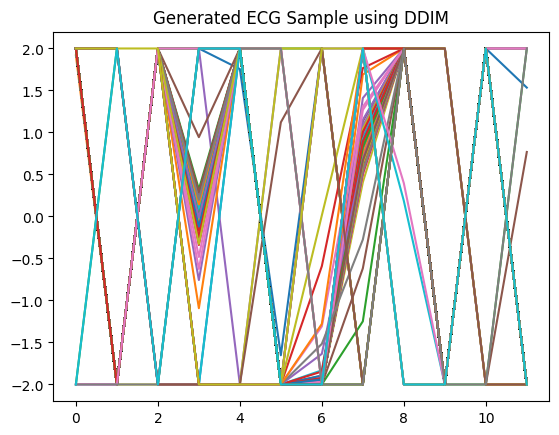

In [56]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch.nn.functional as F

def calculate_tsnr1(signal, noise):
    """Calculate TSNR (Temporal Signal-to-Noise Ratio)."""
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    return 10 * np.log10(signal_power / noise_power)

def calculate_tsnr(signal, noise):
    """Calculate TSNR (Temporal Signal-to-Noise Ratio)."""
    signal_power = torch.mean(signal ** 2)
    noise_power = torch.mean(noise ** 2)
    return 10 * torch.log10(signal_power / noise_power)

# Ensure TSNR doesn't drop below the threshold
def ensure_tsnr(signal, noise, target_snr=21):
    """Adjust noise to ensure that TSNR doesn't drop below the target."""
    current_snr = calculate_tsnr(signal, noise)
    if current_snr < target_snr:
        adjustment_factor = 10 ** ((current_snr - target_snr) / 10)
        noise = noise * adjustment_factor
    return noise

def ensure_tsnr1(signal, noise, target_snr=21):
    """Adjust noise to ensure that TSNR doesn't drop below the target."""
    current_snr = calculate_tsnr1(signal, noise)
    if current_snr < target_snr:
        adjustment_factor = 10 ** ((current_snr - target_snr) / 10)
        noise = noise * adjustment_factor
    return noise

# Define the noise schedule function
def get_noise_schedule(num_timesteps):
    """Get noise schedule for the diffusion process."""
    alpha = np.linspace(0.1, 0.9, num_timesteps)  # Example schedule
    alpha_cumprod = np.cumprod(alpha)  # Cumulative product of alpha
    return torch.tensor(alpha, dtype=torch.float32), torch.tensor(alpha_cumprod, dtype=torch.float32)

# Define Gaussian noise function
def add_gaussian_noise(signal, noise_std):
    """Add Gaussian noise to the signal."""
    noise = torch.randn_like(signal) * noise_std
    return signal + noise

# Define function to add noise according to the diffusion model

def add_noise_to_signal(signal, noise, alpha_t, beta_t, num_leads=12):
    """Add noise to the signal during the forward process based on diffusion parameters."""
    batch_size, num_channels, seq_length = signal.shape

    # Create a noise tensor that matches the ECG signal shape
    noise_tensor = torch.zeros_like(signal)

    for i in range(batch_size):
        # Randomly choose which lead of the ECG to add the noise to
        lead_to_noisy = np.random.randint(0, num_channels)

        # Transpose the noise signal to make leads rows
        transposed_noise = noise.T
        
        # Randomly select one of the two available noise signals
        noise_choice = np.random.randint(0, transposed_noise.shape[0])  # Choose 1 lead from the transposed noise

        # Choose 1000 random samples from the selected noise lead
        random_indices = np.random.choice(transposed_noise.shape[1], seq_length, replace=False)
        noise_for_lead = transposed_noise[noise_choice, random_indices]

        # Convert noise_for_lead to a tensor and add to the ECG signal
        noise_for_lead = torch.tensor(noise_for_lead, dtype=torch.float32).to(signal.device)
        noise_tensor[i, lead_to_noisy, :] = noise_for_lead
    return alpha_t * signal + beta_t * noise_tensor

def give_noise(signal, noise,num_leads=12):
    batch_size, num_channels, seq_length = signal.shape

    # Create a noise tensor that matches the ECG signal shape
    noise_tensor = np.zeros_like(signal)

    for i in range(batch_size):
        # Randomly choose which lead of the ECG to add the noise to
        lead_to_noisy = np.random.randint(0, num_channels)

        # Transpose the noise signal to make leads rows
        transposed_noise = noise.T
        
        # Randomly select one of the two available noise signals
        noise_choice = np.random.randint(0, transposed_noise.shape[0])  # Choose 1 lead from the transposed noise

        # Choose 1000 random samples fronpm the selected noise lead
        random_indices = np.random.choice(transposed_noise.shape[1], seq_length, replace=False)
        noise_for_lead = transposed_noise[noise_choice, random_indices]

        # Convert noise_for_lead to a tensor and add to the ECG signal
        noise_tensor[i, lead_to_noisy, :] = noise_for_lead

    return noise_tensor    

# Define DDIM backward process
def ddim(x_t, pred_noise, t, sigma_t, alpha, alpha_bar):
    alpha_t_bar = alpha_bar[t].item()
    alpha_t_minus_one = alpha[t-1].item()

    pred = (x_t - ((1 - alpha_t_bar) ** 0.5) * pred_noise) / (alpha_t_bar ** 0.5)
    pred = (alpha_t_minus_one ** 0.5) * pred

    pred = pred + ((1 - alpha_t_minus_one - (sigma_t ** 2)) ** 0.5) * pred_noise
    eps_t = torch.randn_like(x_t)  # Add noise
    eps_t = torch.clamp(eps_t, min=0, max=1)  # Clip values to be between -1 and 1
    pred = pred + sigma_t * eps_t
    pred = torch.clamp(pred,min=-2,max=2)
    return pred


def ddpm(x_t, pred_noise, t, alpha, alpha_bar, beta):
    alpha_t = alpha[t].item()
    alpha_t_bar = alpha_bar[t].item()

    eps_coef = (1 - alpha_t) / (1 - alpha_t_bar) ** 0.5
    mean = (1 / (alpha_t ** 0.5)) * (x_t - eps_coef * pred_noise)

    var = beta[t].item()
    z = torch.randn_like(x_t) if t > 0 else 0  # Only add noise if t > 0

    return mean + (var ** 0.5) * z
# Define the Residual Block
class ResidualBlock(nn.Module):
    """A residual block with GELU activation."""
    def __init__(self, in_channels, out_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv1d(in_channels, out_channels, kernel_size=3, padding=1)
        self.gelu = nn.GELU()
        self.conv2 = nn.Conv1d(out_channels, out_channels, kernel_size=3, padding=1)
        self.residual = nn.Conv1d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()

    def forward(self, x):
        residual = self.residual(x)
        x = self.conv1(x)
        x = self.gelu(x)
        x = self.conv2(x)
        return x + residual

# Define the Self-Attention Block
class SelfAttention1D(nn.Module):
    """1D Self-Attention Layer."""
    def __init__(self, channels, num_heads=4):
        super(SelfAttention1D, self).__init__()
        self.attention = nn.MultiheadAttention(channels, num_heads, batch_first=True)

    def forward(self, x):
        x = x.permute(0, 2, 1)  # (batch_size, channels, seq_length) -> (batch_size, seq_length, channels)
        attn_output, _ = self.attention(x, x, x)
        return attn_output.permute(0, 2, 1)  # (batch_size, seq_length, channels) -> (batch_size, channels, seq_length)

# Define the U-Net 1D model
class UNet1D(nn.Module):
    """1D U-Net model with attention blocks."""
    def __init__(self, in_channels, out_channels, base_channels=64):
        super(UNet1D, self).__init__()
        self.encoder1 = ResidualBlock(in_channels, base_channels)
        self.encoder2 = ResidualBlock(base_channels, base_channels * 2)
        self.encoder3 = ResidualBlock(base_channels * 2, base_channels * 4)
        self.attn1 = SelfAttention1D(base_channels * 4)
        
        self.middle = ResidualBlock(base_channels * 4, base_channels * 4)
        self.attn2 = SelfAttention1D(base_channels * 4)
        
        self.decoder1 = ResidualBlock(base_channels * 4, base_channels * 2)
        self.attn3 = SelfAttention1D(base_channels * 2)
        self.decoder2 = ResidualBlock(base_channels * 2, base_channels)
        self.attn4 = SelfAttention1D(base_channels)
        self.decoder3 = ResidualBlock(base_channels, out_channels)

    def forward(self, x):
        x1 = self.encoder1(x)
        x2 = self.encoder2(x1)
        x3 = self.encoder3(x2)
        
        x3 = self.attn1(x3)
        
        x_middle = self.middle(x3)
        x_middle = self.attn2(x_middle)
        
        x = self.decoder1(x_middle + x3)
        x = self.attn3(x)
        x = self.decoder2(x + x2)
        x = self.attn4(x)
        x = self.decoder3(x + x1)
        return x

# Define the Diffusion Model
class DiffusionModel(nn.Module):
    def __init__(self, model, num_timesteps, noise_signal_em, noise_signal_bw, noise_signal_ma):
        super(DiffusionModel, self).__init__()
        self.model = model
        self.num_timesteps = num_timesteps
        self.alpha_schedule, self.alpha_cumprod = get_noise_schedule(num_timesteps)
        self.noise_signal_em = torch.tensor(noise_signal_em, dtype=torch.float32)
        self.noise_signal_bw = torch.tensor(noise_signal_bw, dtype=torch.float32)
        self.noise_signal_ma = torch.tensor(noise_signal_ma, dtype=torch.float32)

    def forward(self, x, t, target_snr=15):
        """Forward process: Add noise from random or combined custom noise signals."""
        alpha_t = self.alpha_schedule[t].to(x.device)
        beta_t = (1 - alpha_t).to(x.device)

        # Randomly choose a noise type or combination
        choice = np.random.choice(['em', 'bw', 'ma', 'comb2', 'comb3'])
        
        if choice == 'em':
            noise = self.noise_signal_em.to(x.device)  # Original noise of shape (650000, 2)
        elif choice == 'bw':
            noise = self.noise_signal_bw.to(x.device)  # Original noise of shape (650000, 2)
        elif choice == 'ma':
            noise = self.noise_signal_ma.to(x.device)  # Original noise of shape (650000, 2)
        elif choice == 'comb2':
            noise_em = self.noise_signal_em.to(x.device)  # Original noise of shape (650000, 2)
            noise_bw = self.noise_signal_bw.to(x.device)  # Original noise of shape (650000, 2)
            noise = (noise_em + noise_bw) / 2.0
        elif choice == 'comb3':
            noise_em = self.noise_signal_em.to(x.device)  # Original noise of shape (650000, 2)
            noise_bw = self.noise_signal_bw.to(x.device)  # Original noise of shape (650000, 2)
            noise_ma = self.noise_signal_ma.to(x.device)  # Original noise of shape (650000, 2)
            noise = (noise_em + noise_bw + noise_ma) / 3.0

        # # Ensure TSNR doesn't drop below the target value
        noise = ensure_tsnr(x, noise, target_snr)
        # Add noise to the signal
        noisy_signal = add_noise_to_signal(x, noise, alpha_t, beta_t)
        return noisy_signal


    def reverse_process(self, noisy_signal, t):
        """Reverse process: Denoise the signal using the model."""
        return self.model(noisy_signal)

# Initialize model and optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_timesteps = 100  # Example number of timesteps
model = UNet1D(in_channels=12, out_channels=12).to(device)
diffusion_model = DiffusionModel(model, num_timesteps, noise_signal_em, noise_signal_bw, noise_signal_ma).to(device)
optimizer = optim.Adam(diffusion_model.parameters(), lr=1e-4)

# Example ECG data for testing
# Shape: (10, 1000, 12)
ecg_data = x_train[:10]  # Replace x_train with your actual data variable

# Training loop
num_epochs = 50
for epoch in range(num_epochs):
    for i in range(ecg_data.shape[0]):
        x = torch.tensor(ecg_data[i], dtype=torch.float32).permute(1, 0).unsqueeze(0).to(device)  # Reshape to (1, 12, 1000)
        t = torch.randint(0, num_timesteps, (1,)).item()  # Random timestep
        
        # Forward diffusion
        noisy_signal = diffusion_model.forward(x, t, target_snr=15)
        
        # Reverse process (denoising)
        reconstructed_signal = diffusion_model.reverse_process(noisy_signal, t)
        
        # Loss function: MSE between original and reconstructed signals
        loss = nn.MSELoss()(reconstructed_signal, x)
        
        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}")

# Define backward DDPM and DDIM sampling
def generate_samples(method='ddpm', num_samples=1, inference_timesteps=10):
    generated_samples = []

    for _ in range(num_samples):
        x = x_train[0].reshape(1,12,1000)
        choice = np.random.choice(['em', 'bw', 'ma', 'comb2', 'comb3'])
        if choice == 'em':
            noise = noise_signal_em  # Original noise of shape (650000, 2)
        elif choice == 'bw':
            noise = noise_signal_bw  # Original noise of shape (650000, 2)
        elif choice == 'ma':
            noise = noise_signal_ma  # Original noise of shape (650000, 2)
        elif choice == 'comb2':
            noise_em = noise_signal_em  # Original noise of shape (650000, 2)
            noise_bw = noise_signal_bw  # Original noise of shape (650000, 2)
            noise = (noise_em + noise_bw) / 2.0
        elif choice == 'comb3':
            noise_em = noise_signal_em  # Original noise of shape (650000, 2)
            noise_bw = noise_signal_bw # Original noise of shape (650000, 2)
            noise_ma = noise_signal_ma  # Original noise of shape (650000, 2)
            noise = (noise_em + noise_bw + noise_ma) / 3.0

        # # Ensure TSNR doesn't drop below the target value
        noise = ensure_tsnr1(x, noise,21)

        # Add noise to the signal
        x = give_noise(x, noise)
        x = torch.tensor(x, dtype=torch.float32).to(device)  # Send to device
        if method == 'ddpm':
            for t in tqdm(reversed(range(num_timesteps))):
                pred_noise = diffusion_model.reverse_process(x, t)
                x = ddpm(x, pred_noise, t, alpha, alpha_bar, beta)

        elif method == 'ddim':
            inference_range = range(0, num_timesteps, num_timesteps // inference_timesteps)
            for t in tqdm(inference_range):
                pred_noise = diffusion_model.reverse_process(x, t)
                x = ddim(x, pred_noise, t, sigma_t=0, alpha=alpha, alpha_bar=alpha_bar)
        generated_samples.append(x.cpu().detach())

    return torch.stack(generated_samples)

# Choose method and generate samples
method = 'ddim'
inference_timesteps = 100
num_samples = 10

# Generate samples
with torch.no_grad():
    generated_samples = generate_samples(method=method, num_samples=num_samples, inference_timesteps=inference_timesteps)

# Plot the last generated sample (ECG data)
plt.plot(generated_samples[-1].squeeze().cpu().numpy())
plt.title(f"Generated ECG Sample using {method.upper()}")
plt.show()

In [57]:
s1 = generated_samples[0].cpu().detach().numpy()
s1 = s1.reshape(1000,12)
print(s1.shape)

(1000, 12)


(1000, 12)
(1000, 12)


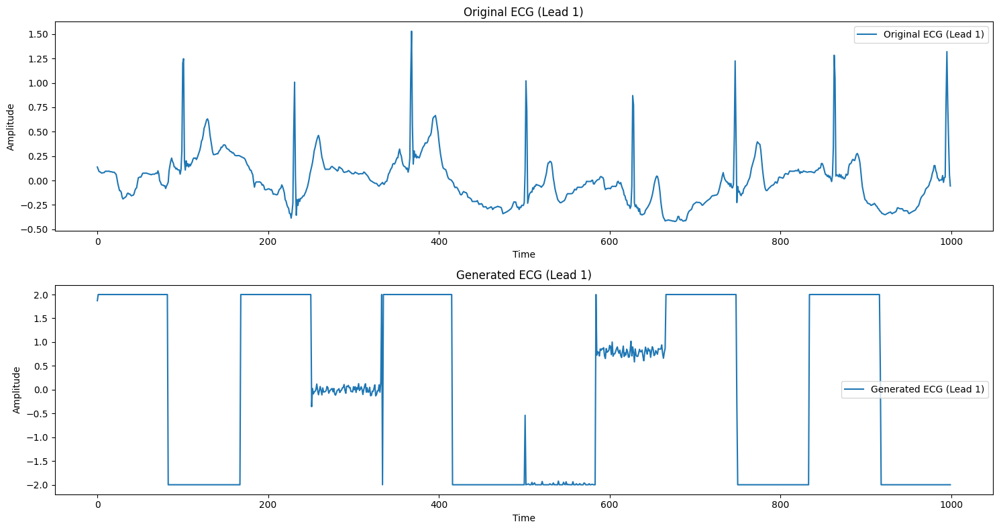

In [58]:
import matplotlib.pyplot as plt

# Convert generated ECG to shape (1000, 12)
generated_ecg_np = s1

# Convert original ECG to shape (1000, 12)
original_ecg_np = x_train[1]

print(generated_ecg_np.shape)
print(original_ecg_np.shape)

# Plot the original and generated ECG signals for comparison
plt.figure(figsize=(15, 8))

# Plotting the first lead (Lead 1) as an example
plt.subplot(2, 1, 1)
plt.plot(original_ecg_np[:, 1], label='Original ECG (Lead 1)')
plt.title('Original ECG (Lead 1)')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(generated_ecg_np[:, 1], label='Generated ECG (Lead 1)')
plt.title('Generated ECG (Lead 1)')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()

plt.tight_layout()
plt.show()

GENERATING SYNTHETIC DATA

In [15]:
import pandas as pd

label_cnt = {}
for i in y_train:
    key = tuple(i.tolist())
    if key not in label_cnt:
        label_cnt[key] = 1
    else:
        label_cnt[key] += 1

df = pd.DataFrame(list(label_cnt.items()), columns=['Label Combination', 'Count'])
df = df.sort_values(by='Count', ascending=False)
print(df)

   Label Combination  Count
0    (0, 0, 0, 1, 0)   8170
1    (0, 0, 1, 0, 0)   2282
2    (0, 0, 0, 0, 1)   2163
4    (1, 0, 0, 0, 0)   1525
7    (1, 0, 1, 0, 0)   1167
10   (0, 1, 0, 0, 1)    710
5    (0, 0, 1, 0, 1)    541
3    (0, 1, 0, 0, 0)    480
8    (1, 0, 0, 0, 1)    434
13   (1, 0, 0, 1, 0)    362
11   (0, 1, 1, 0, 1)    320
6    (1, 1, 0, 0, 0)    273
12   (1, 0, 1, 0, 1)    202
15   (1, 1, 0, 0, 1)    186
9    (0, 1, 1, 0, 0)    166
14   (1, 1, 1, 0, 1)    142
17   (1, 1, 1, 0, 0)    112
16   (0, 0, 0, 1, 1)     24
18   (1, 0, 0, 1, 1)      5
19   (0, 1, 0, 1, 0)      2
20   (1, 1, 1, 1, 0)      1


In [19]:
Train_data = {}
for i in range(len(x_train)):
    key = tuple(y_train[i].tolist())
    if key not in Train_data:
        Train_data[key] = []
    Train_data[key].append(x_train[i])

In [20]:
print(Train_data.keys())
for i in Train_data.keys():
    print(len(Train_data[i]))

dict_keys([(0, 0, 0, 1, 0), (0, 0, 1, 0, 0), (0, 0, 0, 0, 1), (0, 1, 0, 0, 0), (1, 0, 0, 0, 0), (0, 0, 1, 0, 1), (1, 1, 0, 0, 0), (1, 0, 1, 0, 0), (1, 0, 0, 0, 1), (0, 1, 1, 0, 0), (0, 1, 0, 0, 1), (0, 1, 1, 0, 1), (1, 0, 1, 0, 1), (1, 0, 0, 1, 0), (1, 1, 1, 0, 1), (1, 1, 0, 0, 1), (0, 0, 0, 1, 1), (1, 1, 1, 0, 0), (1, 0, 0, 1, 1), (0, 1, 0, 1, 0), (1, 1, 1, 1, 0)])
8170
2282
2163
480
1525
541
273
1167
434
166
710
320
202
362
142
186
24
112
5
2
1


In [21]:
# Define backward DDPM and DDIM sampling
def generate_samples(of,method='ddpm', num_samples=1, inference_timesteps=10):
    generated_samples = []
    for _ in range(num_samples):
        x = np.random.randn(1, 12, 1000)
        choice = np.random.choice(['em', 'bw', 'ma', 'comb2', 'comb3'])
        if choice == 'em':
            noise = noise_signal_em  # Original noise of shape (650000, 2)
        elif choice == 'bw':
            noise = noise_signal_bw  # Original noise of shape (650000, 2)
        elif choice == 'ma':
            noise = noise_signal_ma  # Original noise of shape (650000, 2)
        elif choice == 'comb2':
            noise_em = noise_signal_em  # Original noise of shape (650000, 2)
            noise_bw = noise_signal_bw  # Original noise of shape (650000, 2)
            noise = (noise_em + noise_bw) / 2.0
        elif choice == 'comb3':
            noise_em = noise_signal_em  # Original noise of shape (650000, 2)
            noise_bw = noise_signal_bw # Original noise of shape (650000, 2)
            noise_ma = noise_signal_ma  # Original noise of shape (650000, 2)
            noise = (noise_em + noise_bw + noise_ma) / 3.0

        # Ensure TSNR doesn't drop below the target value
        noise = ensure_tsnr1(x, noise, 21)

        # Add noise to the signal
        x = give_noise(x, noise)
        x1 = of.reshape(1,12,1000)
        x2 = x + x1
        x = torch.tensor(x2, dtype=torch.float32).to(device)  # Send to device
        if method == 'ddpm':
            for t in tqdm(reversed(range(num_timesteps))):
                pred_noise = diffusion_model.reverse_process(x, t)
                x = ddpm(x, pred_noise, t, alpha, alpha_bar, beta)

        elif method == 'ddim':
            inference_range = range(0, num_timesteps, num_timesteps // inference_timesteps)
            for t in tqdm(inference_range):
                pred_noise = diffusion_model.reverse_process(x, t)
                x = ddim(x, pred_noise, t, sigma_t=0, alpha=alpha, alpha_bar=alpha_bar)

        generated_samples.append(x.cpu().detach())

    return torch.stack(generated_samples)


MAX_Sample = 8000
for y in Train_data.keys():
    curr_len = len(Train_data[y])
    Gen_samples = MAX_Sample//curr_len
    if (Gen_samples == 0):
        continue
    print(Gen_samples)
    ## Training the Model

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    num_timesteps = 200  # Example number of timesteps
    model = UNet1D(in_channels=12, out_channels=12).to(device)
    diffusion_model = DiffusionModel(model, num_timesteps, noise_signal_em, noise_signal_bw, noise_signal_ma).to(device)
    optimizer = optim.Adam(diffusion_model.parameters(), lr=1e-4)

    # Example ECG data for testing
    # Shape: (10, 1000, 12)
    ecg_data = np.stack(Train_data[y])
    print(ecg_data.shape)

    # Training loop
    num_epochs = 10
    for epoch in range(num_epochs):
        for i in range(ecg_data.shape[0]):
            x = torch.tensor(ecg_data[i], dtype=torch.float32).permute(1, 0).unsqueeze(0).to(device)  # Reshape to (1, 12, 1000)
            t = torch.randint(0, num_timesteps, (1,)).item()  # Random timestep
            
            # Forward diffusion
            noisy_signal = diffusion_model.forward(x, t, target_snr=21)
            
            # Reverse process (denoising)
            reconstructed_signal = diffusion_model.reverse_process(noisy_signal, t)
            
            # Loss function: MSE between original and reconstructed signals
            loss = nn.MSELoss()(reconstructed_signal, x)
            
            # Backpropagation
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}")
    # Choose method and generate samples
    method = 'ddim'
    inference_timesteps = 25
    for j in range(curr_len):
        curr_sample = Train_data[y][j]
        num_samples = Gen_samples
        # Generate samples
        with torch.no_grad():
            generated_samples = generate_samples(curr_sample,method=method, num_samples=num_samples, inference_timesteps=inference_timesteps)
        for k in generated_samples:
            Train_data[y].append(k)
    print(f"Key {y} and Final Count : {len(Train_data[y])}")
    

3
(2282, 1000, 12)


/tmp/ipykernel_993520/1079794017.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  noise_for_lead = torch.tensor(noise_for_lead, dtype=torch.float32).to(signal.device)


Epoch 1/10, Loss: 0.020459821447730064
Epoch 2/10, Loss: 0.016954651102423668
Epoch 3/10, Loss: 0.01043760310858488
Epoch 4/10, Loss: 0.001878668088465929
Epoch 5/10, Loss: 0.001020675990730524
Epoch 6/10, Loss: 0.002611955627799034
Epoch 7/10, Loss: 0.0006553351995535195
Epoch 8/10, Loss: 0.0011648557847365737
Epoch 9/10, Loss: 0.0004184881108812988
Epoch 10/10, Loss: 0.0005825054249726236


100%|██████████| 25/25 [00:00<00:00, 424.90it/s]


Key (0, 0, 1, 0, 0) and Final Count : 9128
3
(2163, 1000, 12)
Epoch 1/10, Loss: 0.006116183008998632
Epoch 2/10, Loss: 0.00040259480010718107
Epoch 3/10, Loss: 0.0019153151661157608
Epoch 4/10, Loss: 0.0003034686087630689
Epoch 5/10, Loss: 0.0017102569108828902
Epoch 6/10, Loss: 0.004359872080385685
Epoch 7/10, Loss: 0.0008659262675791979
Epoch 8/10, Loss: 0.0010504360543563962
Epoch 9/10, Loss: 0.006165133789181709
Epoch 10/10, Loss: 0.0006207924452610314


100%|██████████| 25/25 [00:00<00:00, 419.64it/s]


Key (0, 0, 0, 0, 1) and Final Count : 8652
16
(480, 1000, 12)
Epoch 1/10, Loss: 0.03932468220591545
Epoch 2/10, Loss: 0.02393132448196411
Epoch 3/10, Loss: 0.014850512146949768
Epoch 4/10, Loss: 0.047972992062568665
Epoch 5/10, Loss: 0.018284939229488373
Epoch 6/10, Loss: 0.0209518913179636
Epoch 7/10, Loss: 0.02100439928472042
Epoch 8/10, Loss: 0.009721297770738602
Epoch 9/10, Loss: 0.05425716191530228
Epoch 10/10, Loss: 0.015808511525392532


100%|██████████| 25/25 [00:00<00:00, 440.09it/s]


Key (0, 1, 0, 0, 0) and Final Count : 8160
5
(1525, 1000, 12)
Epoch 1/10, Loss: 0.032678600400686264
Epoch 2/10, Loss: 0.008086045272648335
Epoch 3/10, Loss: 0.026396576315164566
Epoch 4/10, Loss: 0.0097648361697793
Epoch 5/10, Loss: 0.009363519959151745
Epoch 6/10, Loss: 0.0027369020972400904
Epoch 7/10, Loss: 0.004060183651745319
Epoch 8/10, Loss: 0.004819163121283054
Epoch 9/10, Loss: 0.00277369050309062
Epoch 10/10, Loss: 0.004175354726612568


100%|██████████| 25/25 [00:00<00:00, 434.52it/s]


Key (1, 0, 0, 0, 0) and Final Count : 9150
14
(541, 1000, 12)
Epoch 1/10, Loss: 0.007598156109452248
Epoch 2/10, Loss: 0.01806609332561493
Epoch 3/10, Loss: 0.014819066040217876
Epoch 4/10, Loss: 0.0024702507071197033
Epoch 5/10, Loss: 0.0007859159959480166
Epoch 6/10, Loss: 0.005187613423913717
Epoch 7/10, Loss: 0.014516971074044704
Epoch 8/10, Loss: 0.009723294526338577
Epoch 9/10, Loss: 0.0047032879665493965
Epoch 10/10, Loss: 0.010559824295341969


100%|██████████| 25/25 [00:00<00:00, 455.79it/s]


Key (0, 0, 1, 0, 1) and Final Count : 8115
29
(273, 1000, 12)
Epoch 1/10, Loss: 0.011009790934622288
Epoch 2/10, Loss: 0.006261411588639021
Epoch 3/10, Loss: 0.01978897675871849
Epoch 4/10, Loss: 0.014001808129251003
Epoch 5/10, Loss: 0.0033969583455473185
Epoch 6/10, Loss: 0.0028447185177356005
Epoch 7/10, Loss: 0.004776811692863703
Epoch 8/10, Loss: 0.004807398654520512
Epoch 9/10, Loss: 0.013693166896700859
Epoch 10/10, Loss: 0.01605500653386116


100%|██████████| 25/25 [00:00<00:00, 438.76it/s]


Key (1, 1, 0, 0, 0) and Final Count : 8190
6
(1167, 1000, 12)
Epoch 1/10, Loss: 0.0029584215953946114
Epoch 2/10, Loss: 0.016512902453541756
Epoch 3/10, Loss: 0.0013769755605608225
Epoch 4/10, Loss: 0.009004451334476471
Epoch 5/10, Loss: 0.019078828394412994
Epoch 6/10, Loss: 0.0007628235034644604
Epoch 7/10, Loss: 0.014879361726343632
Epoch 8/10, Loss: 0.004593919031322002
Epoch 9/10, Loss: 0.0005433039041236043
Epoch 10/10, Loss: 0.006209433078765869


100%|██████████| 25/25 [00:00<00:00, 422.84it/s]


Key (1, 0, 1, 0, 0) and Final Count : 8169
18
(434, 1000, 12)
Epoch 1/10, Loss: 0.013372112065553665
Epoch 2/10, Loss: 0.006030118092894554
Epoch 3/10, Loss: 0.018691467121243477
Epoch 4/10, Loss: 0.002383129671216011
Epoch 5/10, Loss: 0.005434838589280844
Epoch 6/10, Loss: 0.01158799696713686
Epoch 7/10, Loss: 0.016443926841020584
Epoch 8/10, Loss: 0.00239014346152544
Epoch 9/10, Loss: 0.002075539669021964
Epoch 10/10, Loss: 0.010411606170237064


100%|██████████| 25/25 [00:00<00:00, 439.36it/s]


Key (1, 0, 0, 0, 1) and Final Count : 8246
48
(166, 1000, 12)
Epoch 1/10, Loss: 0.008352641016244888
Epoch 2/10, Loss: 0.00914101954549551
Epoch 3/10, Loss: 0.005300106946378946
Epoch 4/10, Loss: 0.010472516529262066
Epoch 5/10, Loss: 0.0022976796608418226
Epoch 6/10, Loss: 0.01890682987868786
Epoch 7/10, Loss: 0.006685133557766676
Epoch 8/10, Loss: 0.004188491962850094
Epoch 9/10, Loss: 0.01082657091319561
Epoch 10/10, Loss: 0.003363635390996933


100%|██████████| 25/25 [00:00<00:00, 429.95it/s]


Key (0, 1, 1, 0, 0) and Final Count : 8134
11
(710, 1000, 12)
Epoch 1/10, Loss: 0.00760138314217329
Epoch 2/10, Loss: 0.004743228200823069
Epoch 3/10, Loss: 0.0019047204405069351
Epoch 4/10, Loss: 0.011413317173719406
Epoch 5/10, Loss: 0.000999530777335167
Epoch 6/10, Loss: 0.005129185970872641
Epoch 7/10, Loss: 0.005287668667733669
Epoch 8/10, Loss: 0.003108307486400008
Epoch 9/10, Loss: 0.004932013805955648
Epoch 10/10, Loss: 0.0011893792543560266


100%|██████████| 25/25 [00:00<00:00, 434.47it/s]


Key (0, 1, 0, 0, 1) and Final Count : 8520
25
(320, 1000, 12)
Epoch 1/10, Loss: 0.03144042193889618
Epoch 2/10, Loss: 0.020294856280088425
Epoch 3/10, Loss: 0.014523500576615334
Epoch 4/10, Loss: 0.009996306151151657
Epoch 5/10, Loss: 0.0829690471291542
Epoch 6/10, Loss: 0.0728456899523735
Epoch 7/10, Loss: 0.016937140375375748
Epoch 8/10, Loss: 0.009299331344664097
Epoch 9/10, Loss: 0.040033984929323196
Epoch 10/10, Loss: 0.022372843697667122


100%|██████████| 25/25 [00:00<00:00, 435.94it/s]


Key (0, 1, 1, 0, 1) and Final Count : 8320
39
(202, 1000, 12)
Epoch 1/10, Loss: 0.010884404182434082
Epoch 2/10, Loss: 0.004519019275903702
Epoch 3/10, Loss: 0.002822976093739271
Epoch 4/10, Loss: 0.0031427068170160055
Epoch 5/10, Loss: 0.008127884939312935
Epoch 6/10, Loss: 0.006250148173421621
Epoch 7/10, Loss: 0.0011017058277502656
Epoch 8/10, Loss: 0.004326038993895054
Epoch 9/10, Loss: 0.0011258093873038888
Epoch 10/10, Loss: 0.0035496822092682123


100%|██████████| 25/25 [00:00<00:00, 437.13it/s]


Key (1, 0, 1, 0, 1) and Final Count : 8080
22
(362, 1000, 12)
Epoch 1/10, Loss: 0.008502285927534103
Epoch 2/10, Loss: 0.0014699773164466023
Epoch 3/10, Loss: 0.006617459002882242
Epoch 4/10, Loss: 0.0009719845256768167
Epoch 5/10, Loss: 0.0012292888714000583
Epoch 6/10, Loss: 0.00439676595851779
Epoch 7/10, Loss: 0.0009007467306219041
Epoch 8/10, Loss: 0.008088601753115654
Epoch 9/10, Loss: 0.0017077875090762973
Epoch 10/10, Loss: 0.004588370677083731


100%|██████████| 25/25 [00:00<00:00, 438.75it/s]


Key (1, 0, 0, 1, 0) and Final Count : 8326
56
(142, 1000, 12)
Epoch 1/10, Loss: 0.018558621406555176
Epoch 2/10, Loss: 0.011261425912380219
Epoch 3/10, Loss: 0.008245298638939857
Epoch 4/10, Loss: 0.010733451694250107
Epoch 5/10, Loss: 0.0186759103089571
Epoch 6/10, Loss: 0.004292047116905451
Epoch 7/10, Loss: 0.03823065012693405
Epoch 8/10, Loss: 0.010510635562241077
Epoch 9/10, Loss: 0.012221716344356537
Epoch 10/10, Loss: 0.0027916545514017344


100%|██████████| 25/25 [00:00<00:00, 437.19it/s]


Key (1, 1, 1, 0, 1) and Final Count : 8094
43
(186, 1000, 12)
Epoch 1/10, Loss: 0.018801869824528694
Epoch 2/10, Loss: 0.06660651415586472
Epoch 3/10, Loss: 0.0561024509370327
Epoch 4/10, Loss: 0.05886712670326233
Epoch 5/10, Loss: 0.01572766900062561
Epoch 6/10, Loss: 0.01997051201760769
Epoch 7/10, Loss: 0.008097479119896889
Epoch 8/10, Loss: 0.030750347301363945
Epoch 9/10, Loss: 0.005956320557743311
Epoch 10/10, Loss: 0.004315073601901531


100%|██████████| 25/25 [00:00<00:00, 434.06it/s]


Key (1, 1, 0, 0, 1) and Final Count : 8184
333
(24, 1000, 12)
Epoch 1/10, Loss: 0.05379633605480194
Epoch 2/10, Loss: 0.04640575125813484
Epoch 3/10, Loss: 0.05142885446548462
Epoch 4/10, Loss: 0.039035748690366745
Epoch 5/10, Loss: 0.04957978427410126
Epoch 6/10, Loss: 0.045923471450805664
Epoch 7/10, Loss: 0.03277053311467171
Epoch 8/10, Loss: 0.0266408771276474
Epoch 9/10, Loss: 0.03521937504410744
Epoch 10/10, Loss: 0.027950087562203407


100%|██████████| 25/25 [00:00<00:00, 432.80it/s]


Key (0, 0, 0, 1, 1) and Final Count : 8016
71
(112, 1000, 12)
Epoch 1/10, Loss: 0.015255242586135864
Epoch 2/10, Loss: 0.009833724237978458
Epoch 3/10, Loss: 0.0024196612648665905
Epoch 4/10, Loss: 0.0034495978616178036
Epoch 5/10, Loss: 0.0056104701943695545
Epoch 6/10, Loss: 0.0015362434787675738
Epoch 7/10, Loss: 0.0013333740644156933
Epoch 8/10, Loss: 0.0010185405844822526
Epoch 9/10, Loss: 0.009889882989227772
Epoch 10/10, Loss: 0.0088467663154006


100%|██████████| 25/25 [00:00<00:00, 449.59it/s]


Key (1, 1, 1, 0, 0) and Final Count : 8064
1600
(5, 1000, 12)
Epoch 1/10, Loss: 0.06660991162061691
Epoch 2/10, Loss: 0.05659843236207962
Epoch 3/10, Loss: 0.049977194517850876
Epoch 4/10, Loss: 0.04667602479457855
Epoch 5/10, Loss: 0.04631110653281212
Epoch 6/10, Loss: 0.04539697244763374
Epoch 7/10, Loss: 0.043872468173503876
Epoch 8/10, Loss: 0.04460585489869118
Epoch 9/10, Loss: 0.04495896399021149
Epoch 10/10, Loss: 0.0425383597612381


100%|██████████| 25/25 [00:00<00:00, 445.24it/s]


Key (1, 0, 0, 1, 1) and Final Count : 8005
4000
(2, 1000, 12)
Epoch 1/10, Loss: 0.06927501410245895
Epoch 2/10, Loss: 0.06433133035898209
Epoch 3/10, Loss: 0.059613727033138275
Epoch 4/10, Loss: 0.05445026606321335
Epoch 5/10, Loss: 0.05245903879404068
Epoch 6/10, Loss: 0.046837519854307175
Epoch 7/10, Loss: 0.0429590567946434
Epoch 8/10, Loss: 0.04328450560569763
Epoch 9/10, Loss: 0.04220239445567131
Epoch 10/10, Loss: 0.041011467576026917


100%|██████████| 25/25 [00:00<00:00, 441.36it/s]


Key (0, 1, 0, 1, 0) and Final Count : 8002
8000
(1, 1000, 12)
Epoch 1/10, Loss: 0.06264293193817139
Epoch 2/10, Loss: 0.05997074395418167
Epoch 3/10, Loss: 0.06040143594145775
Epoch 4/10, Loss: 0.05864391103386879
Epoch 5/10, Loss: 0.05611782893538475
Epoch 6/10, Loss: 0.06111497804522514
Epoch 7/10, Loss: 0.05572971701622009
Epoch 8/10, Loss: 0.05577443540096283
Epoch 9/10, Loss: 0.0574953593313694
Epoch 10/10, Loss: 0.05422428250312805


100%|██████████| 25/25 [00:00<00:00, 428.38it/s]


Key (1, 1, 1, 1, 0) and Final Count : 8001
